In [1]:
import turicreate as tc

Invalid PNG file	 file: data/men/00000117.png

Invalid PNG file	 file: data/men/00000919.png

Invalid PNG file	 file: data/men/00000961.png

Unexpected JPEG decode failure	 file: data/men/00000971.jpg

Unexpected JPEG decode failure	 file: data/men/00000991.JPEG

Invalid PNG file	 file: data/men/00001991.png

Invalid PNG file	 file: data/men/00002314.PNG

Invalid PNG file	 file: data/men/01 (1).png

Invalid PNG file	 file: data/men/07 (1).PNG

Invalid PNG file	 file: data/men/07 (2).png

Invalid PNG file	 file: data/women/00000090.png

Invalid PNG file	 file: data/women/00000198.png

Invalid PNG file	 file: data/women/00000897.png

Invalid PNG file	 file: data/women/00000945.png

Invalid PNG file	 file: data/women/00000991.png

Invalid PNG file	 file: data/women/00001093.png

Invalid PNG file	 file: data/women/00001140.png

Invalid PNG file	 file: data/women/00001472.png

Invalid PNG file	 file: data/women/00001493.png

Invalid PNG file	 file: data/women/00001527.png

Invalid PNG file	 file: data/women/00001578.PNG

Invalid PNG file	 file: data/women/00001918.png

Invalid PNG file	 file: data/women/00002091.png

Invalid PNG file	 file: data/women/00002236.png

Read 3067 images in 5.00001 secs	speed: 613.399 file/sec

Unexpected JPEG decode failure	 file: data/women/00002334.jpg

Invalid PNG file	 file: data/women/00002389.png

/opt/anaconda3/envs/turi/lib/python3.7/site-packages/turicreate/visualization/_plot.py:461: UserWarning: Displaying only the first 100 rows.
  warnings.warn("Displaying only the first {} rows.".format(maximum_rows))


,path,image,label
0,data/men/00000001.jpg,,Men
1,data/men/00000002.jpg,,Men
2,data/men/0000000296.png,,Men
3,data/men/00000003.jpg,,Men
4,data/men/00000004.jpg,,Men
5,data/men/00000005.jpg,,Men
6,data/men/00000006.jpg,,Men
7,data/men/00000007.jpg,,Men
8,data/men/00000008.jpg,,Men
9,data/men/00000009.jpg,,Men

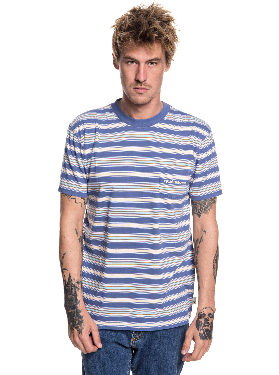
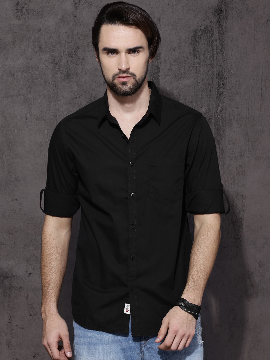
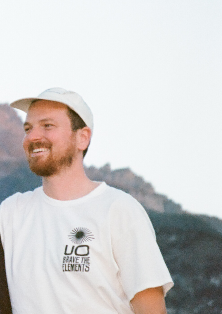
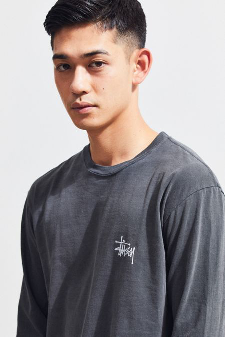
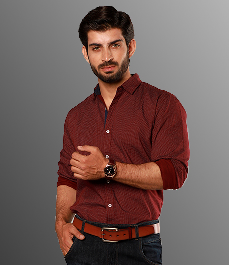
...
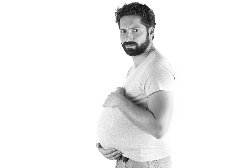
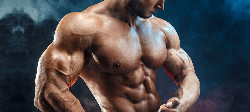
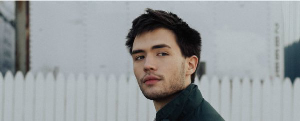
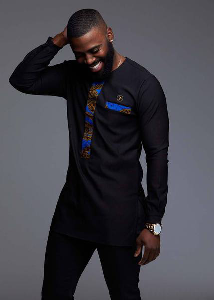
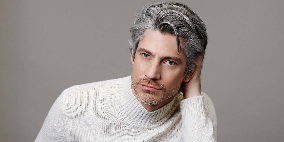

In [2]:
# Load images (Note:'Not a JPEG file' errors are warnings, meaning those files will be skipped)
data = tc.image_analysis.load_images('data', with_path=True)

# From the path-name, create a label column
data['label'] = data['path'].apply(lambda path: 'Men' if '/men' in path else 'wonmen')

# Save the data for future use
data.save('men-women.sframe')

# Explore interactively
data.explore()

In [5]:
import turicreate as tc

# Load the data
data =  tc.SFrame('men-women.sframe')

# Make a train-test split
train_data, test_data = data.random_split(0.8)

# Create the model
#model = tc.image_classifier.create(train_data, target='label')
model = tc.image_classifier.create(train_data, target='label', model="resnet-50")

# Save predictions to an SArray
predictions = model.predict(test_data)

# Evaluate the model and print the results
metrics = model.evaluate(test_data)
print(metrics['accuracy'])

# Save the model for later use in Turi Create
model.save('men-women.model')

# Export for use in Core ML
model.export_coreml('Men-Women.mlmodel')

Analyzing and extracting image features.

+------------------+--------------+------------------+

| Images Processed | Elapsed Time | Percent Complete |

+------------------+--------------+------------------+

| 64               | 3.53s        | 2.25%            |

| 128              | 5.47s        | 4.75%            |

| 192              | 7.62s        | 7%               |

| 256              | 9.72s        | 9.5%             |

| 320              | 12.28s       | 11.75%           |

| 640              | 24.03s       | 23.75%           |

| 960              | 35.24s       | 35.5%            |

| 1280             | 46.33s       | 47.5%            |

| 1600             | 56.71s       | 59.5%            |

| 1920             | 1m 7s        | 71.25%           |

| 2240             | 1m 18s       | 83.25%           |

| 2560             | 1m 28s       | 95%              |

| 2642             | 1m 31s       | 100%             |

+------------------+--------------+------------------+

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Logistic regression:

--------------------------------------------------------

Number of examples          : 2509

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 2048

Number of coefficients      : 2049

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 6        | 0.005124  | 0.595287     | 0.573934          | 0.631579            |

Warning: Reached max step size.

| 1         | 14       | 25.000000 | 1.418880     | 0.876445          | 0.924812            |

| 2         | 15       | 25.000000 | 1.621256     | 0.895974          | 0.917293            |

| 3         | 18       | 4.002995  | 1.986828     | 0.911519          | 0.909774            |

| 4         | 23       | 2.846107  | 2.532624     | 0.919091          | 0.954887            |

| 9         | 39       | 1.936594  | 4.636648     | 0.950976          | 0.962406            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

Analyzing and extracting image features.

+------------------+--------------+------------------+

| Images Processed | Elapsed Time | Percent Complete |

+------------------+--------------+------------------+

| 64               | 2.64s        | 9%               |

| 128              | 4.61s        | 18%              |

| 192              | 6.89s        | 27.25%           |

| 256              | 9.44s        | 36.25%           |

| 320              | 12.21s       | 45.25%           |

| 640              | 21.69s       | 90.75%           |

| 641              | 25.08s       | 100%             |

+------------------+--------------+------------------+

0.9001560062402496
Download completed: /var/folders/lj/k8j_f5xn5gs67rp9x4vsysr80000gn/T/model_cache/resnet-50-TuriCreate-6.0.h5
Download completed: /var/folders/lj/k8j_f5xn5gs67rp9x4vsysr80000gn/T/model_cache/resnet-50-TuriCreate-6.0.mlmodel
